In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
#DATASET ALTOADIGE

df45_temp = pd.read_csv("Temp RCP45.csv",sep = ";")
df85_temp = pd.read_csv("Temp RCP85.csv",sep = ";")
df_act_temp = pd.read_csv("Temp 1980-2020.csv",sep = ";")
# converte le temperature in numeri decimali
df45_temp["Temp 10p"] = df45_temp["Temp 10p"].str.replace(",", ".").astype(float)
df45_temp["Temp 90p"] = df45_temp["Temp 90p"].str.replace(",", ".").astype(float)
df45_temp["Temp Mean"] = df45_temp["Temp Mean"].str.replace(",", ".").astype(float)

df85_temp["Temp 10p"] = df85_temp["Temp 10p"].str.replace(",", ".").astype(float)
df85_temp["Temp 90p"] = df85_temp["Temp 90p"].str.replace(",", ".").astype(float)
df85_temp["Temp Mean"] = df85_temp["Temp Mean"].str.replace(",", ".").astype(float)

df_act_temp["Temp"] = df_act_temp["Temp"].str.replace(",", ".").astype(float)

## TEMPERATURE per comune altoadige

C:\Users\m.bettini\AppData\Local\Temp\ipykernel_2792\391329254.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 3))


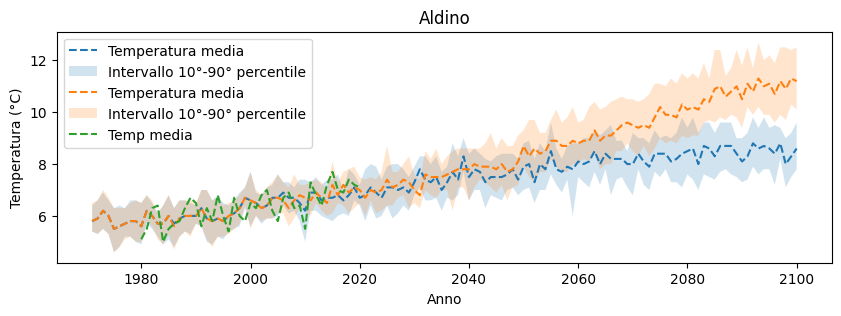

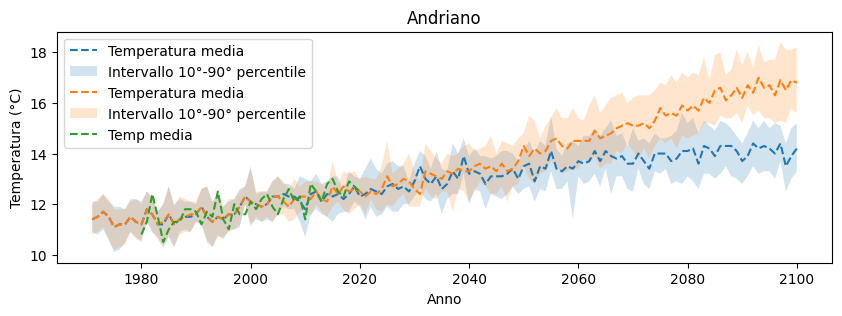

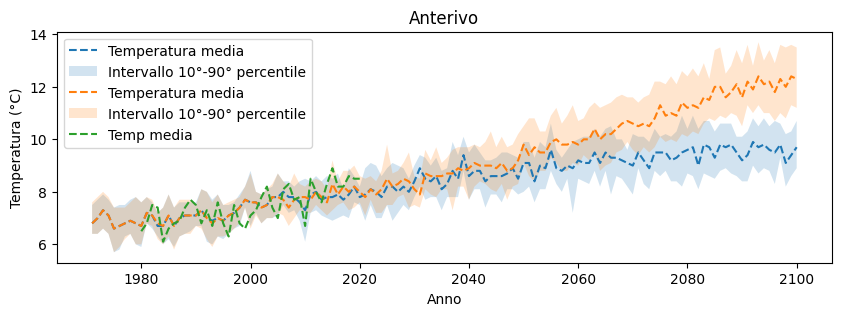

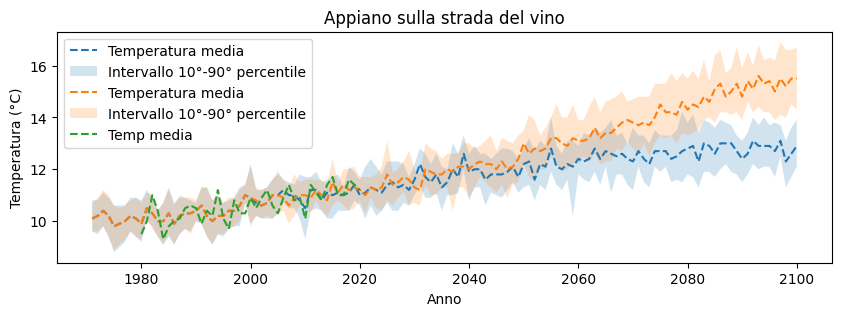

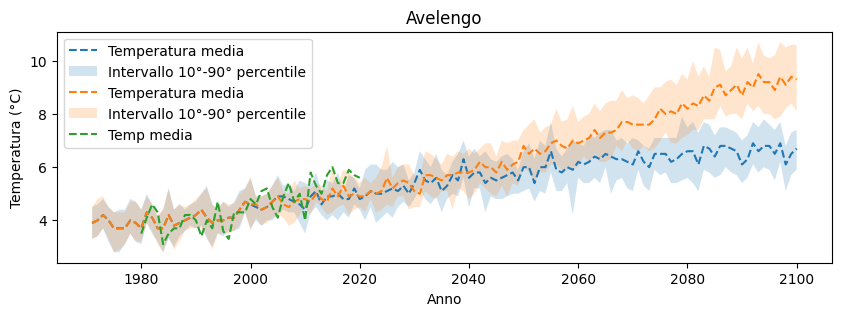

...

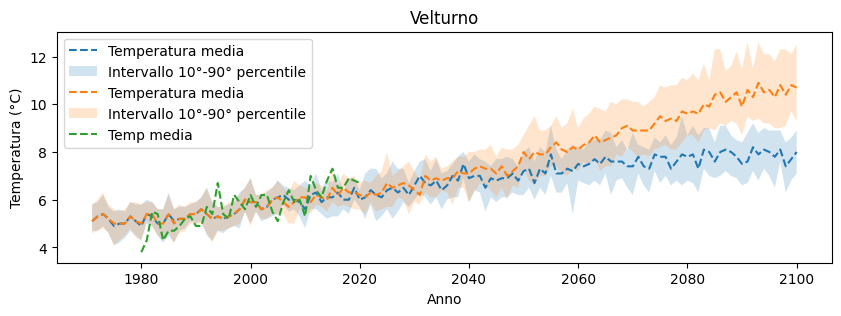

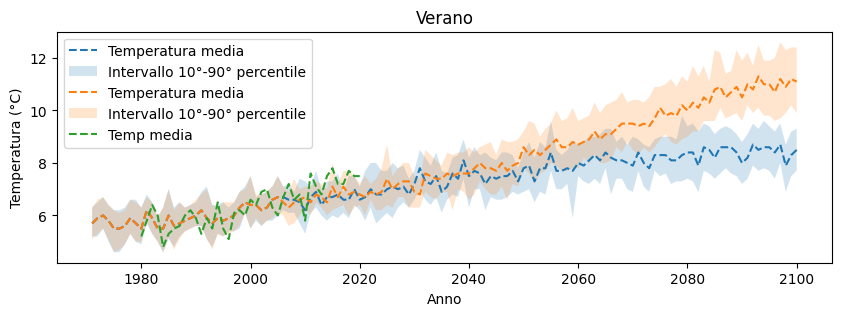

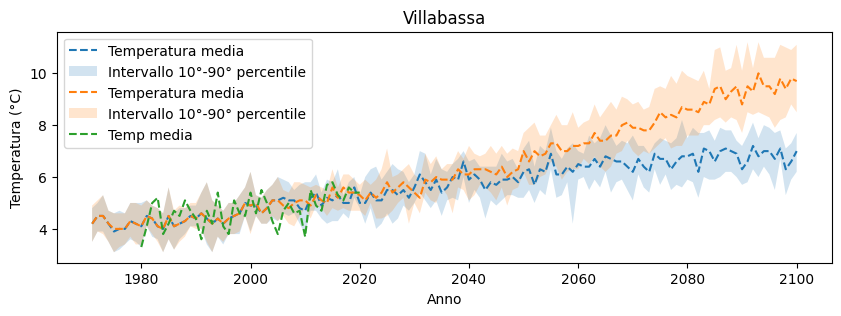

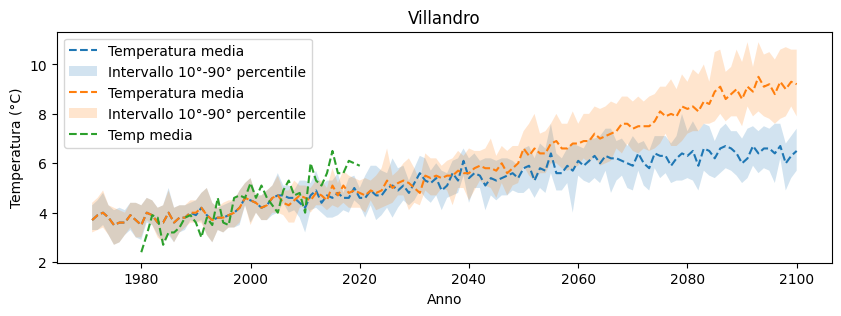

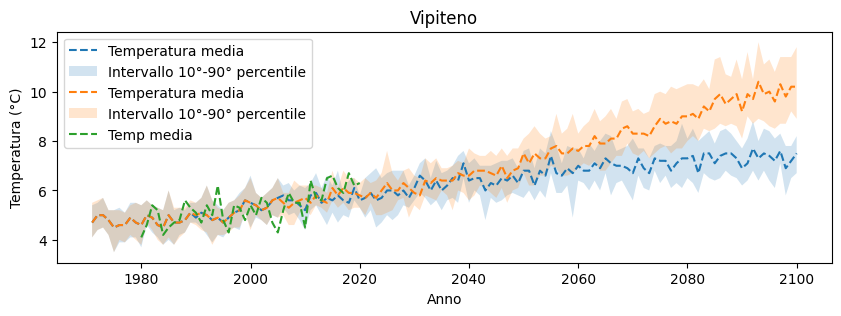

In [5]:

# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_temp = df45_temp.groupby(["name_it", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})
df_agg85_temp = df85_temp.groupby(["name_it", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})

df_agg_act_temp = df_act_temp.groupby(["name_it", "Year"]).agg({"Temp": "mean"})

# crea una figura e un'area di disegno per ogni località
for nome in df_agg45_temp.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc45_temp = df_agg45_temp.loc[nome]
    df_loc85_temp = df_agg85_temp.loc[nome]
    
    df_loc_act_temp = df_agg_act_temp.loc[nome]

    # crea una figura e un'area di disegno per la località corrente
    #fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(df_loc45_temp.index.get_level_values("Year"), df_loc45_temp["Temp Mean"], "--", label="Temperatura media")
    ax.fill_between(df_loc45_temp.index.get_level_values("Year"), df_loc45_temp["Temp 10p"], df_loc45_temp["Temp 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc45_temp.index.get_level_values("Year"), df_loc85_temp["Temp Mean"], "--", label="Temperatura media")
    ax.fill_between(df_loc45_temp.index.get_level_values("Year"), df_loc85_temp["Temp 10p"], df_loc85_temp["Temp 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc_act_temp.index.get_level_values("Year"), df_loc_act_temp["Temp"], "--", label="Temp media")
    # aggiungi una legenda e etichette agli assi
    ax.legend()
    ax.set_xlabel("Anno")
    ax.set_ylabel("Temperatura (°C)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
   # plt.show()

## Media totale TEMPERATURE per comune altoadige

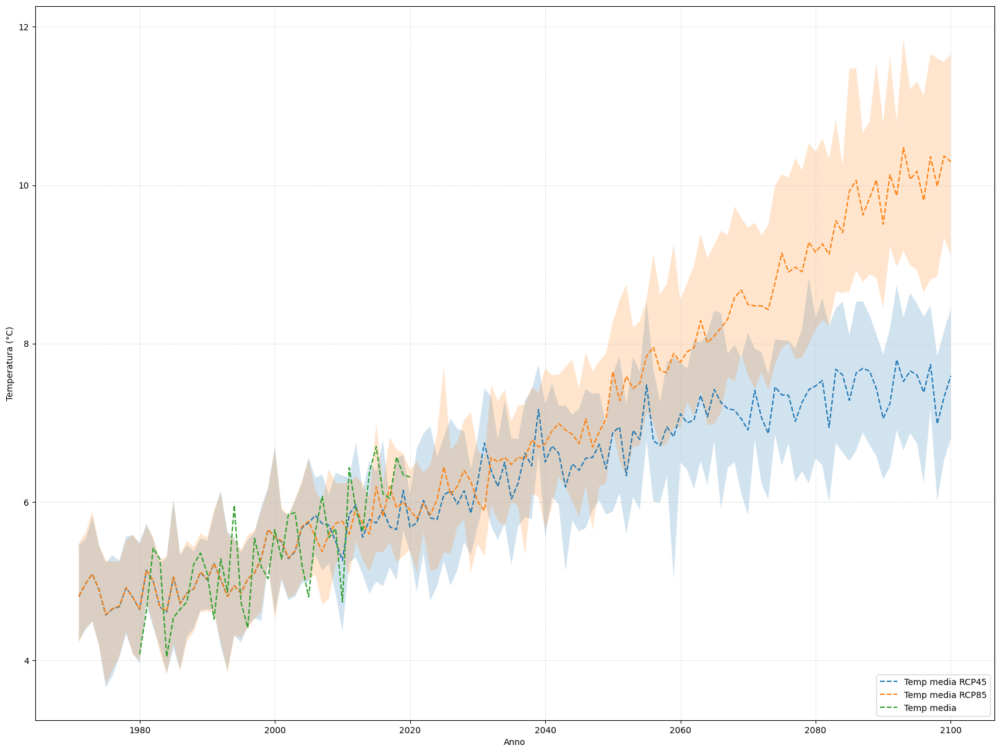

In [6]:

# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_temp = df45_temp.groupby("Year").agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})
df_agg85_temp = df85_temp.groupby("Year").agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})

df_agg_act_temp = df_act_temp.groupby("Year").agg({"Temp": "mean"})

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(df_agg45_temp.index, df_agg45_temp["Temp Mean"], "--", label="Temp media RCP45")
ax.fill_between(df_agg45_temp.index, df_agg45_temp["Temp 10p"], df_agg45_temp["Temp 90p"], alpha=0.2)

ax.plot(df_agg85_temp.index, df_agg85_temp["Temp Mean"], "--", label="Temp media RCP85")
ax.fill_between(df_agg85_temp.index, df_agg85_temp["Temp 10p"], df_agg85_temp["Temp 90p"], alpha=0.2)

ax.plot(df_agg_act_temp.index, df_agg_act_temp["Temp"], "--", label="Temp media")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Temperatura (°C)")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

In [7]:
df45_prec = pd.read_csv("Prec RCP45.csv",sep = ";")
df85_prec = pd.read_csv("Prec RCP85.csv",sep = ";")
df_act_prec = pd.read_csv("Prec 1980-2020.csv",sep = ";")
# converte le temperature in numeri decimali
df45_prec["Prec 10p"] = df45_prec["Prec 10p"].str.replace(",", ".").astype(float)
df45_prec["Prec 90p"] = df45_prec["Prec 90p"].str.replace(",", ".").astype(float)
df45_prec["Prec mean"] = df45_prec["Prec mean"].str.replace(",", ".").astype(float)

df85_prec["Prec 10p"] = df85_prec["Prec 10p"].str.replace(",", ".").astype(float)
df85_prec["Prec 90p"] = df85_prec["Prec 90p"].str.replace(",", ".").astype(float)
df85_prec["Prec mean"] = df85_prec["Prec mean"].str.replace(",", ".").astype(float)

df_act_prec["Prec"] = df_act_prec["Prec"].str.replace(",", ".").astype(float)

## PRECIPITAZIONI per comune altoadige

C:\Users\m.bettini\AppData\Local\Temp\ipykernel_2792\3992849716.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 3))


Error in callback <function _draw_all_if_interactive at 0x00000207E788C8B0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

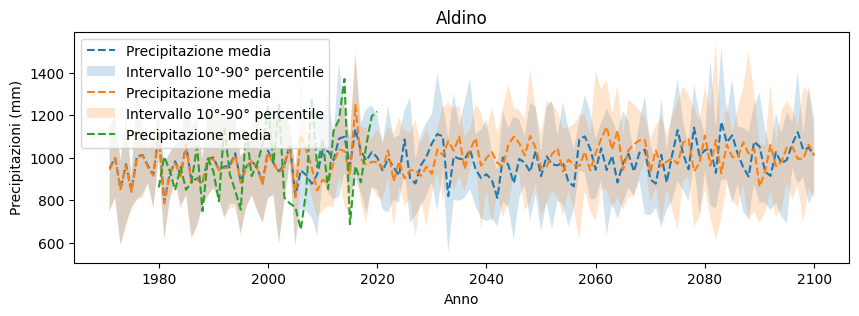

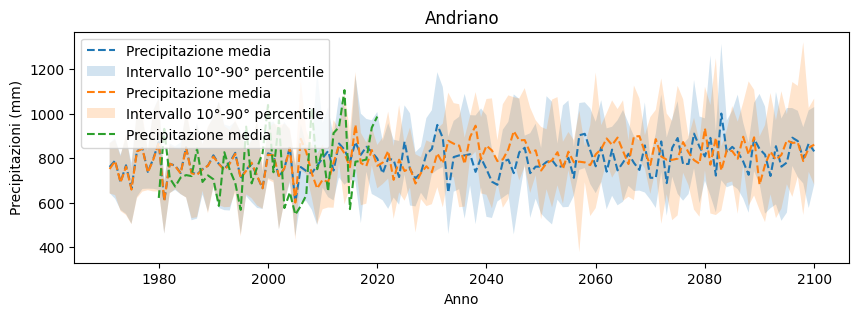

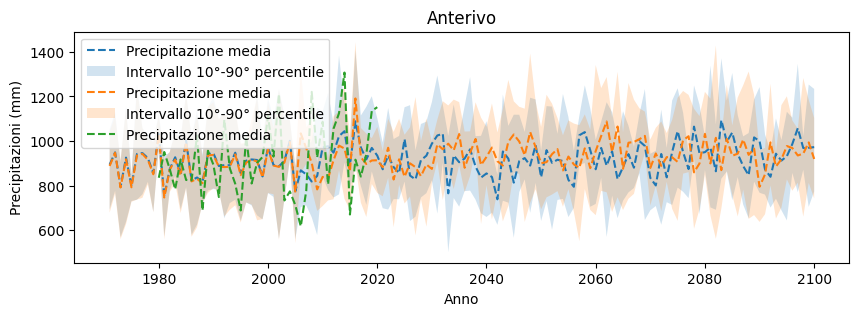

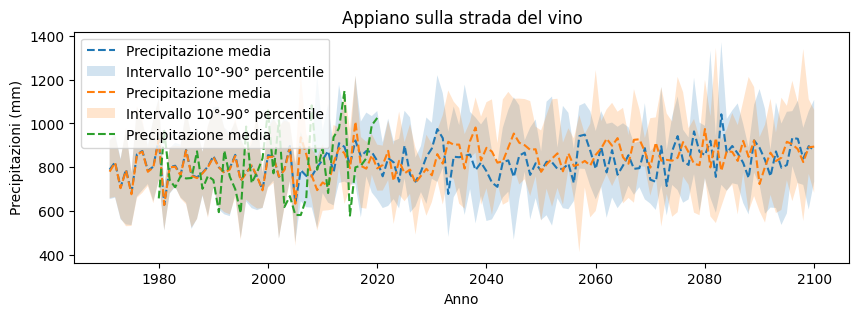

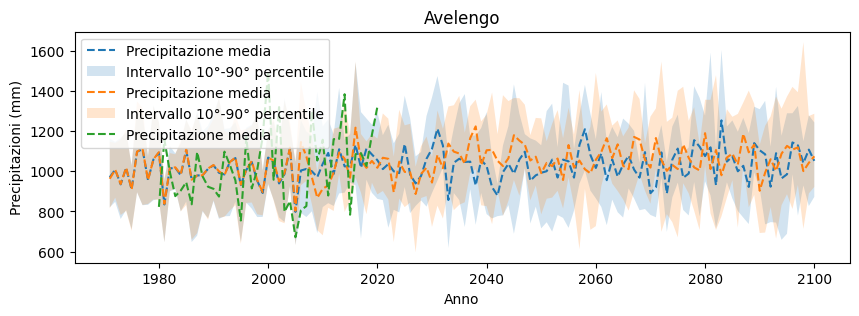

...

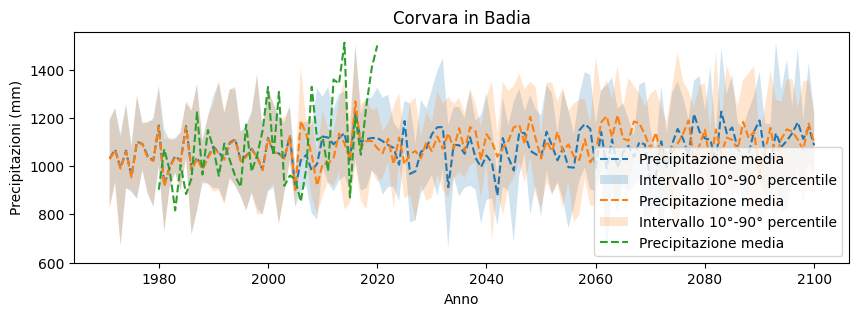

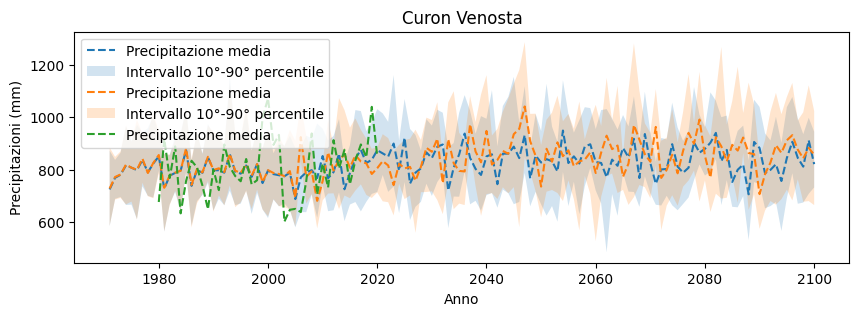

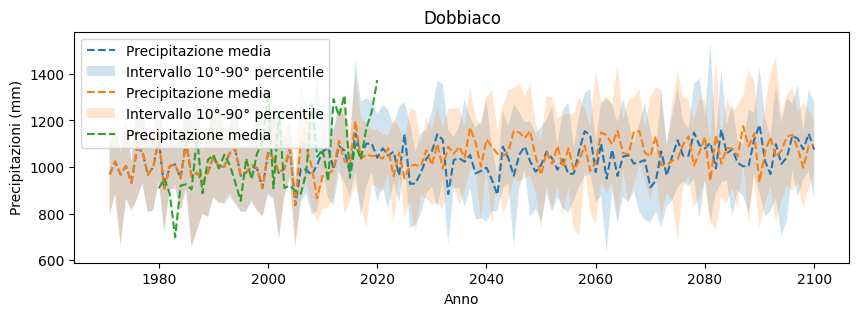

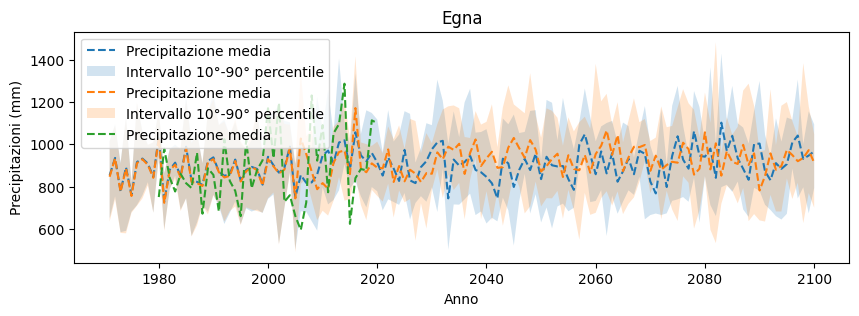

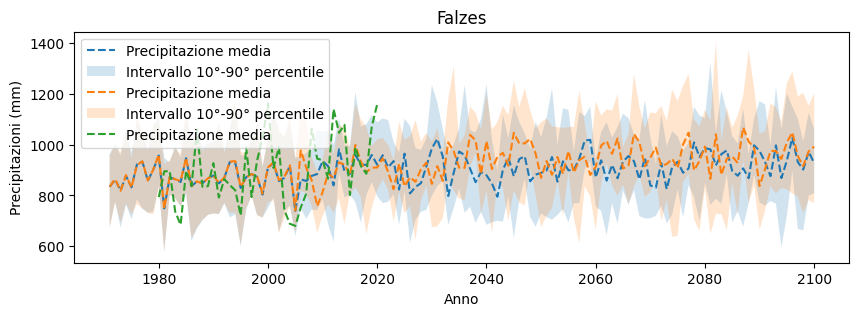

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_prec = df45_prec.groupby(["name_it", "Year"]).agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})
df_agg85_prec = df85_prec.groupby(["name_it", "Year"]).agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})

df_agg_act_prec = df_act_prec.groupby(["name_it", "Year"]).agg({"Prec": "mean"})

# crea una figura e un'area di disegno per ogni località
for nome in df_agg45_prec.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc45_prec = df_agg45_prec.loc[nome]
    df_loc85_prec = df_agg85_prec.loc[nome]
    
    df_loc_act_prec = df_agg_act_prec.loc[nome]

    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(df_loc45_prec.index.get_level_values("Year"), df_loc45_prec["Prec mean"], "--", label="Precipitazione media")
    ax.fill_between(df_loc45_prec.index.get_level_values("Year"), df_loc45_prec["Prec 10p"], df_loc45_prec["Prec 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc45_prec.index.get_level_values("Year"), df_loc85_prec["Prec mean"], "--", label="Precipitazione media")
    ax.fill_between(df_loc45_prec.index.get_level_values("Year"), df_loc85_prec["Prec 10p"], df_loc85_prec["Prec 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc_act_prec.index.get_level_values("Year"), df_loc_act_prec["Prec"], "--", label="Precipitazione media")
    # aggiungi una legenda e etichette agli assi
    ax.legend()
    ax.set_xlabel("Anno")
    ax.set_ylabel("Precipitazioni (mm)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
    #plt.show()

## PRECIPITAZIONI medie per comune altoadige

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_prec = df45_prec.groupby("Year").agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})
df_agg85_prec = df85_prec.groupby("Year").agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})

df_agg_act_prec = df_act_prec.groupby("Year").agg({"Prec": "mean"})

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(df_agg45_prec.index, df_agg45_prec["Prec mean"], "--", label="Prec media RCP45")
ax.fill_between(df_agg45_prec.index, df_agg45_prec["Prec 10p"], df_agg45_prec["Prec 90p"], alpha=0.2)

ax.plot(df_agg85_prec.index, df_agg85_prec["Prec mean"], "--", label="Prec media RCP85")
ax.fill_between(df_agg85_prec.index, df_agg85_prec["Prec 10p"], df_agg85_prec["Prec 90p"], alpha=0.2)

ax.plot(df_agg_act_prec.index, df_agg_act_prec["Prec"], "--", label="Prec media")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Precipitazioni (mm)")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
#plt.show()

#Range di precipitazioni aumenta (aumentano i picchi minimi e massimi) aumenta la varianza

In [ ]:
#DATASET ITALIA

df45_temp_ITA = pd.read_csv("RCP45 Temp ITA.csv",sep = ";")
df85_temp_ITA = pd.read_csv("RCP85 Temp ITA.csv",sep = ";")
df_act_temp_ITA = pd.read_csv("Temp ITA 1971-2021.csv",sep = ";")
# converte le temperature in numeri decimali
df45_temp_ITA["Temp 10p"] = df45_temp_ITA["Temp 10p"].str.replace(",", ".").astype(float)
df45_temp_ITA["Temp 90p"] = df45_temp_ITA["Temp 90p"].str.replace(",", ".").astype(float)
df45_temp_ITA["Temp Mean"] = df45_temp_ITA["Temp Mean"].str.replace(",", ".").astype(float)

df85_temp_ITA["Temp 10p"] = df85_temp_ITA["Temp 10p"].str.replace(",", ".").astype(float)
df85_temp_ITA["Temp 90p"] = df85_temp_ITA["Temp 90p"].str.replace(",", ".").astype(float)
df85_temp_ITA["Temp Mean"] = df85_temp_ITA["Temp Mean"].str.replace(",", ".").astype(float)

df_act_temp_ITA["Temp"] = df_act_temp_ITA["Temp"].str.replace(",", ".").astype(float)

## TEMPERATURE per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_temp_ITA = df45_temp_ITA.groupby(["provincia", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})
df_agg85_temp_ITA = df85_temp_ITA.groupby(["provincia", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})

df_agg_act_temp_ITA = df_act_temp_ITA.groupby(["provincia", "Year"]).agg({"Temp": "mean"})

# crea una figura e un'area di disegno per ogni località
for nome in df_agg45_temp_ITA.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc45_temp_ITA = df_agg45_temp_ITA.loc[nome]
    df_loc85_temp_ITA = df_agg85_temp_ITA.loc[nome]
    
    df_loc_act_temp_ITA = df_agg_act_temp_ITA.loc[nome]

    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(df_loc45_temp_ITA.index.get_level_values("Year"), df_loc45_temp_ITA["Temp Mean"], "--", label="Temperatura media")
    ax.fill_between(df_loc45_temp_ITA.index.get_level_values("Year"), df_loc45_temp_ITA["Temp 10p"], df_loc45_temp_ITA["Temp 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc45_temp_ITA.index.get_level_values("Year"), df_loc85_temp_ITA["Temp Mean"], "--", label="Temperatura media")
    ax.fill_between(df_loc45_temp_ITA.index.get_level_values("Year"), df_loc85_temp_ITA["Temp 10p"], df_loc85_temp_ITA["Temp 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc_act_temp_ITA.index.get_level_values("Year"), df_loc_act_temp_ITA["Temp"], "--", label="Temp media")
    # aggiungi una legenda e etichette agli assi
    ax.legend()
    ax.set_xlabel("Anno")
    ax.set_ylabel("Temperatura (°C)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
   # plt.show()

## TEMPERATURA media per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_temp_ITA = df45_temp_ITA.groupby("Year").agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})
df_agg85_temp_ITA = df85_temp_ITA.groupby("Year").agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})

df_agg_act_temp_ITA = df_act_temp_ITA.groupby("Year").agg({"Temp": "mean"})

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(df_agg45_temp_ITA.index, df_agg45_temp_ITA["Temp Mean"], "--", label="Temp media RCP45")
ax.fill_between(df_agg45_temp_ITA.index, df_agg45_temp_ITA["Temp 10p"], df_agg45_temp_ITA["Temp 90p"], alpha=0.2)

ax.plot(df_agg85_temp_ITA.index, df_agg85_temp_ITA["Temp Mean"], "--", label="Temp media RCP85")
ax.fill_between(df_agg85_temp_ITA.index, df_agg85_temp_ITA["Temp 10p"], df_agg85_temp_ITA["Temp 90p"], alpha=0.2)

ax.plot(df_agg_act_temp_ITA.index, df_agg_act_temp_ITA["Temp"], "--", label="Temp media")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Temperatura (°C)")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

In [ ]:
df_temp_ITA_EC = pd.read_csv("Temperature Data Ensemble Changes.csv",sep = ";")

df_temp_ITA_EC["Temp RCP45 10p"] = df_temp_ITA_EC["Temp RCP45 10p"].str.replace(",", ".").astype(float)
df_temp_ITA_EC["Temp RCP85 10p"] = df_temp_ITA_EC["Temp RCP85 10p"].str.replace(",", ".").astype(float)
df_temp_ITA_EC["Temp RCP45 90p"] = df_temp_ITA_EC["Temp RCP45 90p"].str.replace(",", ".").astype(float)
df_temp_ITA_EC["Temp RCP85 90p"] = df_temp_ITA_EC["Temp RCP85 90p"].str.replace(",", ".").astype(float)
df_temp_ITA_EC["Temp RCP45 Mean"] = df_temp_ITA_EC["Temp RCP45 Mean"].str.replace(",", ".").astype(float)
df_temp_ITA_EC["Temp RCP85 Mean"] = df_temp_ITA_EC["Temp RCP85 Mean"].str.replace(",", ".").astype(float)

## VARIAZIONE di Temperatura per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg_temp_ITA_EC = df_temp_ITA_EC.groupby(["provincia", "Year"]).agg({"Temp RCP45 10p": "mean", "Temp RCP45 90p": "mean", "Temp RCP45 Mean": "mean","Temp RCP85 10p": "mean", "Temp RCP85 90p": "mean", "Temp RCP85 Mean": "mean"})


# crea una figura e un'area di disegno per ogni località
for nome in df_agg_temp_ITA_EC.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc_temp_ITA = df_agg_temp_ITA_EC.loc[nome]

    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(df_loc_temp_ITA.index.get_level_values("Year"), df_loc_temp_ITA["Temp RCP45 Mean"], "--", label="Ensemble Change RCP45")
    ax.fill_between(df_loc_temp_ITA.index.get_level_values("Year"), df_loc_temp_ITA["Temp RCP45 10p"], df_loc_temp_ITA["Temp RCP45 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc_temp_ITA.index.get_level_values("Year"), df_loc_temp_ITA["Temp RCP85 Mean"], "--", label="Ensemble Change RCP85")
    ax.fill_between(df_loc_temp_ITA.index.get_level_values("Year"), df_loc_temp_ITA["Temp RCP85 10p"], df_loc_temp_ITA["Temp RCP85 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    # aggiungi una legenda e etichette agli assi
    ax.legend()
    ax.set_xlabel("Anno")
    ax.set_ylabel("Variazione Temperatura (°C)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
   # plt.show()

## Variazione media di temperatura per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg_temp_ITA_EC = df_temp_ITA_EC.groupby("Year").agg({"Temp RCP45 10p": "mean", "Temp RCP45 90p": "mean", "Temp RCP45 Mean": "mean","Temp RCP85 10p": "mean", "Temp RCP85 90p": "mean", "Temp RCP85 Mean": "mean"})


# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(df_agg_temp_ITA_EC.index, df_agg_temp_ITA_EC["Temp RCP45 Mean"], "--", label="Ensemble Change RCP45")
ax.fill_between(df_agg_temp_ITA_EC.index, df_agg_temp_ITA_EC["Temp RCP45 10p"], df_agg_temp_ITA_EC["Temp RCP45 90p"], alpha=0.2)

ax.plot(df_agg_temp_ITA_EC.index, df_agg_temp_ITA_EC["Temp RCP85 Mean"], "--", label="Ensemble Change RCP85")
ax.fill_between(df_agg_temp_ITA_EC.index, df_agg_temp_ITA_EC["Temp RCP85 10p"], df_agg_temp_ITA_EC["Temp RCP85 90p"], alpha=0.2)


# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Variazione Temperatura (°C)")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

In [ ]:
df_prec_ITA_EC = pd.read_csv("Precipitation Data Ensemble Changes.csv",sep = ";")

df_prec_ITA_OBS = pd.read_csv("Prec ITA 1971-2021.csv",sep = ";")

df_prec_ITA_EC["Prec RCP45 10p"] = df_prec_ITA_EC["Prec RCP45 10p"].str.replace(",", ".").astype(float)
df_prec_ITA_EC["Prec RCP85 10p"] = df_prec_ITA_EC["Prec RCP85 10p"].str.replace(",", ".").astype(float)
df_prec_ITA_EC["Prec RCP45 90p"] = df_prec_ITA_EC["Prec RCP45 90p"].str.replace(",", ".").astype(float)
df_prec_ITA_EC["Prec RCP85 90p"] = df_prec_ITA_EC["Prec RCP85 90p"].str.replace(",", ".").astype(float)
df_prec_ITA_EC["Prec RCP45 Mean"] = df_prec_ITA_EC["Prec RCP45 Mean"].str.replace(",", ".").astype(float)
df_prec_ITA_EC["Prec RCP85 Mean"] = df_prec_ITA_EC["Prec RCP85 Mean"].str.replace(",", ".").astype(float)

df_prec_ITA_OBS["Prec"] = df_prec_ITA_OBS["Prec"].str.replace(",", ".").astype(float)

## Variazione di precipitazioni per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg_prec_ITA_EC = df_prec_ITA_EC.groupby(["provincia", "Year"]).agg({"Prec RCP45 10p": "mean", "Prec RCP45 90p": "mean", "Prec RCP45 Mean": "mean","Prec RCP85 10p": "mean", "Prec RCP85 90p": "mean", "Prec RCP85 Mean": "mean"})

df_prec_ITA_OBS_agg = df_prec_ITA_OBS.groupby(["provincia", "Year"]).agg({"Prec": "mean"})

# crea una figura e un'area di disegno per ogni località
for nome in df_agg_prec_ITA_EC.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc_prec_ITA = df_agg_prec_ITA_EC.loc[nome]
    
    df_loc_prec_ITA_OBS = df_prec_ITA_OBS_agg.loc[nome]

    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(df_loc_prec_ITA.index.get_level_values("Year"), df_loc_prec_ITA["Prec RCP45 Mean"], "--", label="Ensemble Change RCP45")
    ax.fill_between(df_loc_prec_ITA.index.get_level_values("Year"), df_loc_prec_ITA["Prec RCP45 10p"], df_loc_prec_ITA["Prec RCP45 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(df_loc_prec_ITA.index.get_level_values("Year"), df_loc_prec_ITA["Prec RCP85 Mean"], "--", label="Ensemble Change RCP85")
    ax.fill_between(df_loc_prec_ITA.index.get_level_values("Year"), df_loc_prec_ITA["Prec RCP85 10p"], df_loc_prec_ITA["Prec RCP85 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    
    # aggiungi una legenda e etichette agli assi
    ax.legend()
    ax.set_xlabel("Anno")
    ax.set_ylabel("Precipitazioni (mm)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
    #plt.show()

## Variazione media di precipitazioni per provincia Italia

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg_prec_ITA_EC = df_prec_ITA_EC.groupby("Year").agg({"Prec RCP45 10p": "mean", "Prec RCP45 90p": "mean", "Prec RCP45 Mean": "mean","Prec RCP85 10p": "mean", "Prec RCP85 90p": "mean", "Prec RCP85 Mean": "mean"})


# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(df_agg_prec_ITA_EC.index, df_agg_prec_ITA_EC["Prec RCP45 Mean"], "--", label="Ensemble Change RCP45")
ax.fill_between(df_agg_prec_ITA_EC.index, df_agg_prec_ITA_EC["Prec RCP45 10p"], df_agg_prec_ITA_EC["Prec RCP45 90p"], alpha=0.2)

ax.plot(df_agg_prec_ITA_EC.index, df_agg_prec_ITA_EC["Prec RCP85 Mean"], "--", label="Ensemble Change RCP85")
ax.fill_between(df_agg_prec_ITA_EC.index, df_agg_prec_ITA_EC["Prec RCP85 10p"], df_agg_prec_ITA_EC["Prec RCP85 90p"], alpha=0.2)


# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Precipitazioni (mm)")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

In [ ]:
Frost_Days_AltoAdige = pd.read_csv("Frost Days Alto Adige Model.csv",sep = ";")
Frost_Days_AltoAdige_OBS_1000m = pd.read_csv("Frost_days_1980_2021_Observation_1000m.csv",sep = ";")
Frost_Days_AltoAdige_OBS_2000m = pd.read_csv("Frost_days_1980_2021_Observation_2000m.csv",sep = ";")

Heat_Days_AltoAdige = pd.read_csv("Hot Days Alto Adige Model.csv",sep = ";")
Heat_Days_AltoAdige_OBS = pd.read_csv("Heat_Days_1980_2021_OBS_AltoAdige.csv",sep = ";")

# converte le temperature in numeri decimali
Frost_Days_AltoAdige["Days RCP45 10p 1000m"] = Frost_Days_AltoAdige["Days RCP45 10p 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 10p 1000m"] = Frost_Days_AltoAdige["Days RCP85 10p 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP45 10p 2000m"] = Frost_Days_AltoAdige["Days RCP45 10p 2000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 10p 2000m"] = Frost_Days_AltoAdige["Days RCP85 10p 2000m"].str.replace(",", ".").astype(float)

Frost_Days_AltoAdige["Days RCP45 90p 1000m"] = Frost_Days_AltoAdige["Days RCP45 90p 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 90p 1000m"] = Frost_Days_AltoAdige["Days RCP85 90p 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP45 90p 2000m"] = Frost_Days_AltoAdige["Days RCP45 90p 2000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 90p 2000m"] = Frost_Days_AltoAdige["Days RCP85 90p 2000m"].str.replace(",", ".").astype(float)

Frost_Days_AltoAdige["Days RCP45 Mean 1000m"] = Frost_Days_AltoAdige["Days RCP45 Mean 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 Mean 1000m"] = Frost_Days_AltoAdige["Days RCP85 Mean 1000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP45 Mean 2000m"] = Frost_Days_AltoAdige["Days RCP45 Mean 2000m"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige["Days RCP85 Mean 2000m"] = Frost_Days_AltoAdige["Days RCP85 Mean 2000m"].str.replace(",", ".").astype(float)

Frost_Days_AltoAdige_OBS_1000m["Days"] = Frost_Days_AltoAdige_OBS_1000m["Days"].str.replace(",", ".").astype(float)
Frost_Days_AltoAdige_OBS_2000m["Days"] = Frost_Days_AltoAdige_OBS_2000m["Days"].str.replace(",", ".").astype(float)

Heat_Days_AltoAdige["Days RCP45 10p"] = Heat_Days_AltoAdige["Days RCP45 10p"].str.replace(",", ".").astype(float)
Heat_Days_AltoAdige["Days RCP85 10p"] = Heat_Days_AltoAdige["Days RCP85 10p"].str.replace(",", ".").astype(float)
Heat_Days_AltoAdige["Days RCP45 90p"] = Heat_Days_AltoAdige["Days RCP45 90p"].str.replace(",", ".").astype(float)
Heat_Days_AltoAdige["Days RCP85 90p"] = Heat_Days_AltoAdige["Days RCP85 90p"].str.replace(",", ".").astype(float)
Heat_Days_AltoAdige["Days RCP45 Mean"] = Heat_Days_AltoAdige["Days RCP45 Mean"].str.replace(",", ".").astype(float)
Heat_Days_AltoAdige["Days RCP85 Mean"] = Heat_Days_AltoAdige["Days RCP85 Mean"].str.replace(",", ".").astype(float)

Heat_Days_AltoAdige_OBS["Days"] = Heat_Days_AltoAdige_OBS["Days"].str.replace(",", ".").astype(float)

## Giorni di Frost (temp sotto lo zero) in un anno per comune Alto-Adige

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
Frost_Days_AltoAdige_agg = Frost_Days_AltoAdige.groupby(["name_it", "Year"]).agg({"Days RCP45 10p 1000m": "mean", "Days RCP85 10p 1000m": "mean", "Days RCP45 10p 2000m": "mean","Days RCP85 10p 2000m": "mean","Days RCP45 90p 1000m": "mean", "Days RCP85 90p 1000m": "mean","Days RCP45 90p 2000m": "mean","Days RCP85 90p 2000m": "mean", "Days RCP45 Mean 1000m": "mean","Days RCP85 Mean 1000m": "mean","Days RCP45 Mean 2000m": "mean", "Days RCP85 Mean 2000m": "mean"})

Frost_Days_AltoAdige_agg_1000m = Frost_Days_AltoAdige_OBS_1000m.groupby(["name_it", "Year"]).agg({"Days": "mean"})
Frost_Days_AltoAdige_agg_2000m = Frost_Days_AltoAdige_OBS_2000m.groupby(["name_it", "Year"]).agg({"Days": "mean"})                  
                                                                                  

# crea una figura e un'area di disegno per ogni località
for nome in Frost_Days_AltoAdige_agg.index.levels[0]:
    # filtra il DataFrame per la località corrente
    Frost_Days_AltoAdige_Loc = Frost_Days_AltoAdige_agg.loc[nome]
    
    Frost_Days_AltoAdige_1000m_Loc = Frost_Days_AltoAdige_agg_1000m.loc[nome]
    
    Frost_Days_AltoAdige_2000m_Loc = Frost_Days_AltoAdige_agg_2000m.loc[nome]
    
    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP45 Mean 1000m"], "--", label="Ensemble Change RCP45 1000m")
    ax.fill_between(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP45 10p 1000m"], Frost_Days_AltoAdige_Loc["Days RCP45 90p 1000m"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP85 Mean 1000m"], "--", label="Ensemble Change RCP85 1000m")
    ax.fill_between(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP85 10p 1000m"], Frost_Days_AltoAdige_Loc["Days RCP85 90p 1000m"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Frost_Days_AltoAdige_1000m_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_1000m_Loc["Days"], "--", label="Obs Days")
    
    # aggiungi una legenda e etichette agli assi
    ax.legend(loc = 'lower left')
    ax.set_xlabel("Anno")
    ax.set_ylabel("Temperatura (°C)")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)
    
    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP45 Mean 2000m"], "--", label="Ensemble Change RCP45 2000m")
    ax.fill_between(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP45 10p 2000m"], Frost_Days_AltoAdige_Loc["Days RCP45 90p 2000m"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP85 Mean 2000m"], "--", label="Ensemble Change RCP85 2000m")
    ax.fill_between(Frost_Days_AltoAdige_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_Loc["Days RCP85 10p 2000m"], Frost_Days_AltoAdige_Loc["Days RCP85 90p 2000m"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Frost_Days_AltoAdige_2000m_Loc.index.get_level_values("Year"), Frost_Days_AltoAdige_2000m_Loc["Days"], "--", label="Obs Days")
    # aggiungi una legenda e etichette agli assi
    ax.legend(loc = 'lower left')
    ax.set_xlabel("Anno")
    ax.set_ylabel("Frost Days")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

    # mostra la figura
    #plt.show()

    

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
Frost_Days_AltoAdige_agg_year = Frost_Days_AltoAdige.groupby(["Year"]).agg({"Days RCP45 10p 1000m": "mean", "Days RCP85 10p 1000m": "mean", "Days RCP45 10p 2000m": "mean","Days RCP85 10p 2000m": "mean","Days RCP45 90p 1000m": "mean", "Days RCP85 90p 1000m": "mean","Days RCP45 90p 2000m": "mean","Days RCP85 90p 2000m": "mean", "Days RCP45 Mean 1000m": "mean","Days RCP85 Mean 1000m": "mean","Days RCP45 Mean 2000m": "mean", "Days RCP85 Mean 2000m": "mean"})

Frost_Days_AltoAdige_agg_1000m_year = Frost_Days_AltoAdige_OBS_1000m.groupby(["Year"]).agg({"Days": "mean"})
Frost_Days_AltoAdige_agg_2000m_year = Frost_Days_AltoAdige_OBS_2000m.groupby(["Year"]).agg({"Days": "mean"})

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP45 Mean 1000m"], "--", label="Frost Days RCP45 1000m")
ax.fill_between(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP45 10p 1000m"], Frost_Days_AltoAdige_agg_year["Days RCP45 90p 1000m"], alpha=0.2)

ax.plot(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP85 Mean 1000m"], "--", label="Frost Days RCP85 1000m")
ax.fill_between(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP85 10p 1000m"], Frost_Days_AltoAdige_agg_year["Days RCP85 90p 1000m"], alpha=0.2)

ax.plot(Frost_Days_AltoAdige_agg_1000m_year.index, Frost_Days_AltoAdige_agg_1000m_year["Days"], "--", label="Frost Days OBS")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Frost Days")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP45 Mean 2000m"], "--", label="Frost Days RCP45 2000m")
ax.fill_between(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP45 10p 2000m"], Frost_Days_AltoAdige_agg_year["Days RCP45 90p 2000m"], alpha=0.2)

ax.plot(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP85 Mean 2000m"], "--", label="Frost Days RCP85 2000m")
ax.fill_between(Frost_Days_AltoAdige_agg_year.index, Frost_Days_AltoAdige_agg_year["Days RCP85 10p 2000m"], Frost_Days_AltoAdige_agg_year["Days RCP85 90p 2000m"], alpha=0.2)

ax.plot(Frost_Days_AltoAdige_agg_2000m_year.index, Frost_Days_AltoAdige_agg_2000m_year["Days"], "--", label="Frost Days OBS")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Frost Days")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

## Giorni di Heat (superamento del 95th temperatura) all'anno per comune Alto-Adige

In [ ]:
Heat_Days_AltoAdige_agg = Heat_Days_AltoAdige.groupby(["name_it", "Year"]).agg({"Days RCP45 10p" : "mean","Days RCP85 10p":"mean","Days RCP45 90p":"mean","Days RCP85 90p":"mean","Days RCP45 Mean":"mean","Days RCP85 Mean":"mean"})                  
Heat_Days_AltoAdige_OBS_agg = Heat_Days_AltoAdige_OBS.groupby(["name_it", "Year"]).agg({"Days": "mean"})      

# crea una figura e un'area di disegno per ogni località
for nome in Heat_Days_AltoAdige_agg.index.levels[0]:
    # filtra il DataFrame per la località corrente
    Heat_Days_AltoAdige_Loc = Heat_Days_AltoAdige_agg.loc[nome]
    
    Heat_Days_AltoAdige_OBS_Loc = Heat_Days_AltoAdige_OBS_agg.loc[nome]
    
    # crea una figura e un'area di disegno per la località corrente
    fig, ax = plt.subplots(figsize=(10, 3))

    # plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per la località corrente
    ax.plot(Heat_Days_AltoAdige_Loc.index.get_level_values("Year"), Heat_Days_AltoAdige_Loc["Days RCP45 Mean"], "--", label="Ensemble Change RCP45")
    ax.fill_between(Heat_Days_AltoAdige_Loc.index.get_level_values("Year"), Heat_Days_AltoAdige_Loc["Days RCP45 10p"], Heat_Days_AltoAdige_Loc["Days RCP45 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Heat_Days_AltoAdige_Loc.index.get_level_values("Year"), Heat_Days_AltoAdige_Loc["Days RCP85 Mean"], "--", label="Ensemble Change RCP85")
    ax.fill_between(Heat_Days_AltoAdige_Loc.index.get_level_values("Year"), Heat_Days_AltoAdige_Loc["Days RCP85 10p"], Heat_Days_AltoAdige_Loc["Days RCP85 90p"], alpha=0.2, label="Intervallo 10°-90° percentile")
    
    ax.plot(Heat_Days_AltoAdige_OBS_Loc.index.get_level_values("Year"), Heat_Days_AltoAdige_OBS_Loc["Days"], "--", label="Obs Days")
    
    # aggiungi una legenda e etichette agli assi
    ax.legend(loc = 'upper left')
    ax.set_xlabel("Anno")
    ax.set_ylabel("Heat Days")

    # aggiungi il nome della località come titolo della figura
    ax.set_title(nome)

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
Heat_Days_AltoAdige_agg_year = Heat_Days_AltoAdige.groupby(["Year"]).agg({"Days RCP45 10p" : "mean","Days RCP85 10p":"mean","Days RCP45 90p":"mean","Days RCP85 90p":"mean","Days RCP45 Mean":"mean","Days RCP85 Mean":"mean"})                  
Heat_Days_AltoAdige_OBS_agg_year = Heat_Days_AltoAdige_OBS.groupby(["Year"]).agg({"Days": "mean"}) 

# crea una figura e un'area di disegno
fig, ax = plt.subplots(figsize=(20, 15))

# plotta l'anno sull'asse x e la temperatura media con i percentile sull'asse y per tutte le località
ax.plot(Heat_Days_AltoAdige_agg_year.index, Heat_Days_AltoAdige_agg_year["Days RCP45 Mean"], "--", label="Heat Days RCP45")
ax.fill_between(Heat_Days_AltoAdige_agg_year.index, Heat_Days_AltoAdige_agg_year["Days RCP45 10p"], Heat_Days_AltoAdige_agg_year["Days RCP45 90p"], alpha=0.2)

ax.plot(Heat_Days_AltoAdige_agg_year.index, Heat_Days_AltoAdige_agg_year["Days RCP85 Mean"], "--", label="Heat Days RCP85")
ax.fill_between(Heat_Days_AltoAdige_agg_year.index, Heat_Days_AltoAdige_agg_year["Days RCP85 10p"], Heat_Days_AltoAdige_agg_year["Days RCP85 90p"], alpha=0.2)

ax.plot(Heat_Days_AltoAdige_OBS_agg_year.index, Heat_Days_AltoAdige_OBS_agg_year["Days"], "--", label="Heat Days OBS")

# aggiungi una legenda e etichette agli assi
ax.legend(loc = 'lower right')
ax.set_xlabel("Anno")
ax.set_ylabel("Heat Days")
ax.grid(True,linestyle = ':', linewidth=0.5)

# mostra la figura
plt.show()

## Correlation Matrix

In [ ]:
# raggruppa per anno e calcola la temperatura media, il 10th e 90th percentile per ogni anno
df_agg45_temp = df45_temp.groupby(["name_it", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})
df_agg85_temp = df85_temp.groupby(["name_it", "Year"]).agg({"Temp Mean": "mean", "Temp 10p": "mean", "Temp 90p": "mean"})

df_agg45_prec = df45_prec.groupby(["name_it", "Year"]).agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})
df_agg85_prec = df85_prec.groupby(["name_it", "Year"]).agg({"Prec mean": "mean", "Prec 10p": "mean", "Prec 90p": "mean"})

Frost_Days_AltoAdige_agg = Frost_Days_AltoAdige.groupby(["name_it", "Year"]).agg({"Days RCP45 10p 1000m": "mean", "Days RCP85 10p 1000m": "mean", "Days RCP45 10p 2000m": "mean","Days RCP85 10p 2000m": "mean","Days RCP45 90p 1000m": "mean", "Days RCP85 90p 1000m": "mean","Days RCP45 90p 2000m": "mean","Days RCP85 90p 2000m": "mean", "Days RCP45 Mean 1000m": "mean","Days RCP85 Mean 1000m": "mean","Days RCP45 Mean 2000m": "mean", "Days RCP85 Mean 2000m": "mean"})
Heat_Days_AltoAdige_agg = Heat_Days_AltoAdige.groupby(["name_it", "Year"]).agg({"Days RCP45 10p" : "mean","Days RCP85 10p":"mean","Days RCP45 90p":"mean","Days RCP85 90p":"mean","Days RCP45 Mean":"mean","Days RCP85 Mean":"mean"})                  


# crea una figura e un'area di disegno per ogni località
for nome in df_agg45_temp.index.levels[0]:
    # filtra il DataFrame per la località corrente
    df_loc45_temp = df_agg45_temp.loc[nome]
    df_loc85_temp = df_agg85_temp.loc[nome]
    
    df_loc45_prec = df_agg45_prec.loc[nome]
    df_loc85_prec = df_agg85_prec.loc[nome]
    
    Frost_Days_AltoAdige_Loc = Frost_Days_AltoAdige_agg.loc[nome]
    Heat_Days_AltoAdige_Loc = Heat_Days_AltoAdige_agg.loc[nome]
    
    print(nome)
    print(df_loc45_temp['Temp Mean'].corr(df_loc45_prec['Prec mean']))
    print(df_loc85_temp['Temp Mean'].corr(df_loc85_prec['Prec mean']))
    print(df_loc45_temp['Temp Mean'].corr(Frost_Days_AltoAdige_Loc['Days RCP45 Mean 1000m']))
    print(df_loc45_temp['Temp Mean'].corr(Frost_Days_AltoAdige_Loc['Days RCP45 Mean 2000m']))
    print(df_loc85_temp['Temp Mean'].corr(Frost_Days_AltoAdige_Loc['Days RCP85 Mean 1000m']))
    print(df_loc85_temp['Temp Mean'].corr(Frost_Days_AltoAdige_Loc['Days RCP85 Mean 2000m']))
    print(df_loc45_temp['Temp Mean'].corr(Heat_Days_AltoAdige_Loc['Days RCP85 Mean']))
    print(df_loc85_temp['Temp Mean'].corr(Heat_Days_AltoAdige_Loc['Days RCP85 Mean']))
    
    